In [ ]:
from google.colab.patches import cv2_imshow
import cv2 as cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import requests
from io import BytesIO
from requests import exceptions
import argparse
import os
from google.colab import drive
import random

In [ ]:
!pip install git+https://github.com/tensorflow/examples.git
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix
from IPython.display import clear_output

  Cloning https://github.com/tensorflow/examples.git to /tmp/pip-req-build-npkmgrc5
  Running command git clone -q https://github.com/tensorflow/examples.git /tmp/pip-req-build-npkmgrc5
  Created wheel for tensorflow-examples: filename=tensorflow_examples-15980eb4be13e187657e1e20165915c7ff742b98_-py3-none-any.whl size=268216 sha256=c6b51b0403ba003cf03beeb22e7c60bb75a43c92fe3167daff98157ec3739f0f
  Stored in directory: /tmp/pip-ephem-wheel-cache-l5zl1730/wheels/eb/19/50/2a4363c831fa12b400af86325a6f26ade5d2cdc5b406d552ca
Failed to build tensorflow-examples
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


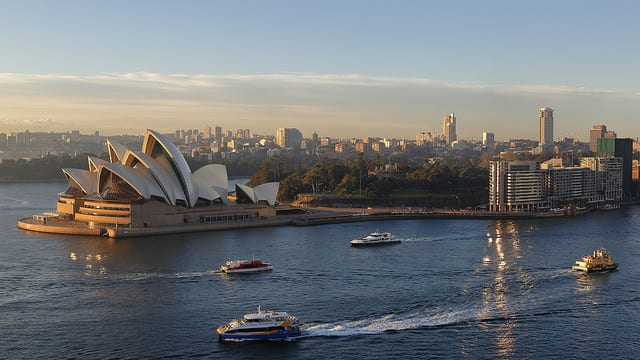

In [ ]:
img = cv2.imread('/content/gdrive/MyDrive/Sydney-Opera-House.jpg')
# width = imageWidth
# height = int((img.shape[0] /img.shape[1])*imageWidth)
# dim = (width, height)
# # resize image
# scale = 0.5
# center_x, center_y = img.shape[1] / 2, img.shape[0] / 2
# width_scaled, height_scaled = img.shape[1] * scale, img.shape[0] * scale
# left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
# top_y, bottom_y = center_y - height_scaled / 2, center_y + height_scaled / 2
# img = img[int(top_y):int(bottom_y), int(left_x):int(right_x)]
# img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
cv2_imshow(img)

In [ ]:
dataPath = "/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth"

In [ ]:
#Number of files to be obtained from the folder
limit = 10

In [ ]:
#Empty list for image paths
imgPaths = [] 
#Getting list of datafiles of a specified length
for f in os.listdir(dataPath)[:limit]:
  if f.endswith(('.jpg', '.png', '.jpeg')):
    tempFPath = dataPath+"/"+f
    imgPaths.append(tempFPath)
imgPaths

['/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000000.png',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000002 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000004 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000006 (2).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000007 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000011 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000013 (2).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000014 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000015 (3).jpg',
 '/content/gdrive/MyDrive/Science/IndependentStudy12th/Datasets/BingTeeth/00000016 (3).jpg']

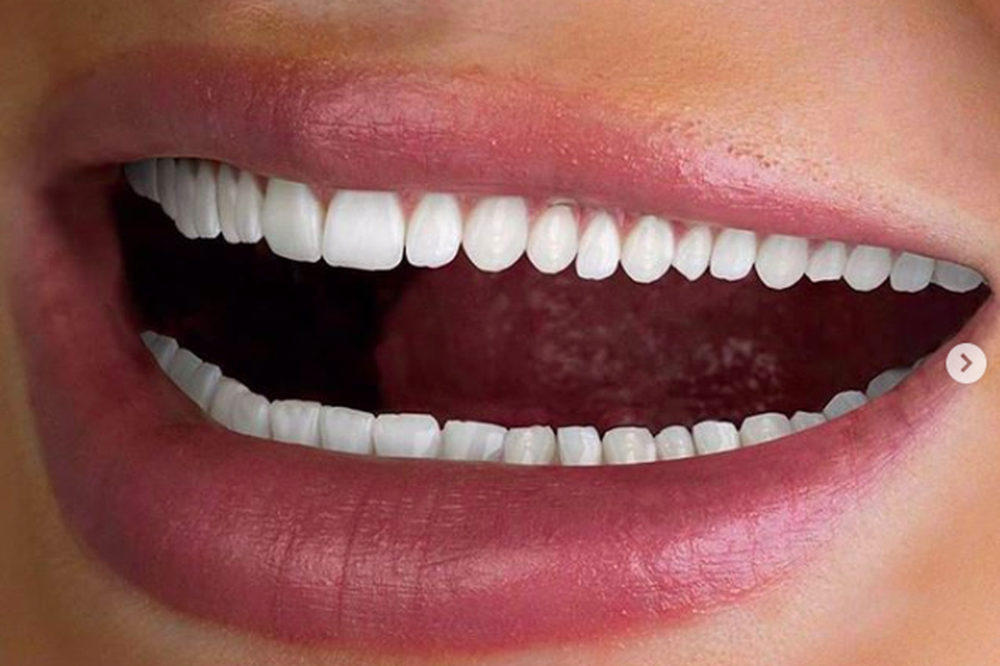

In [ ]:
img = cv2.imread(imgPaths[0])
cv2_imshow(img)

blur


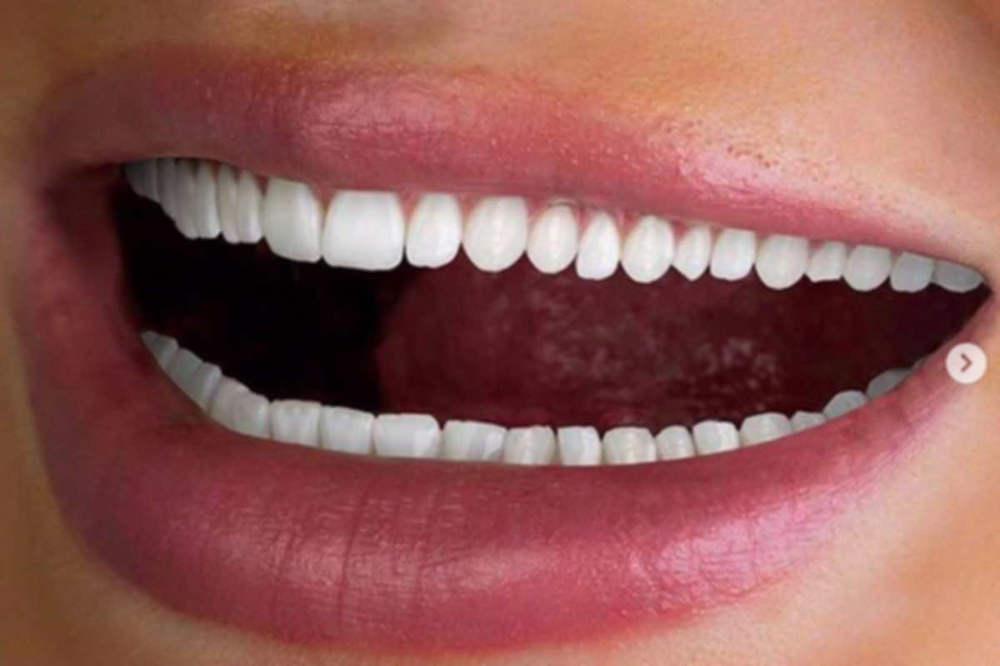

blur0


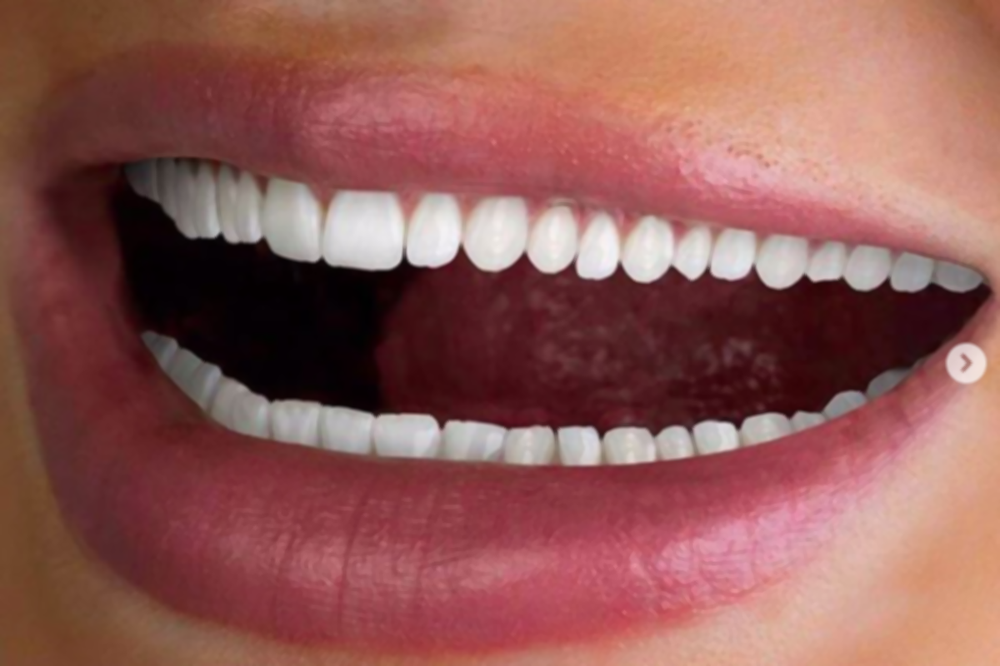

blur1


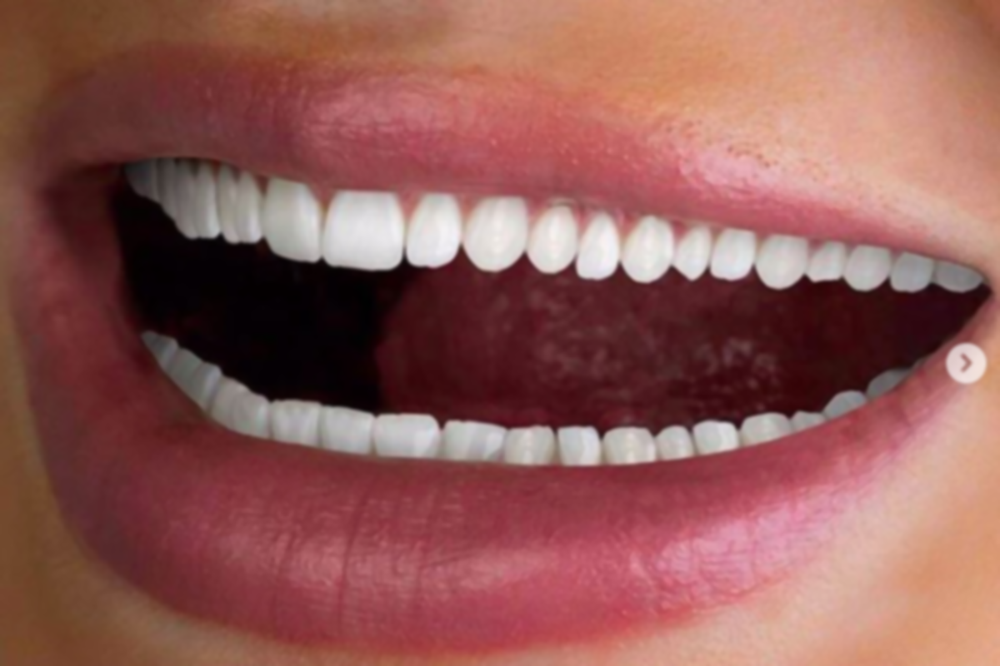

blur2


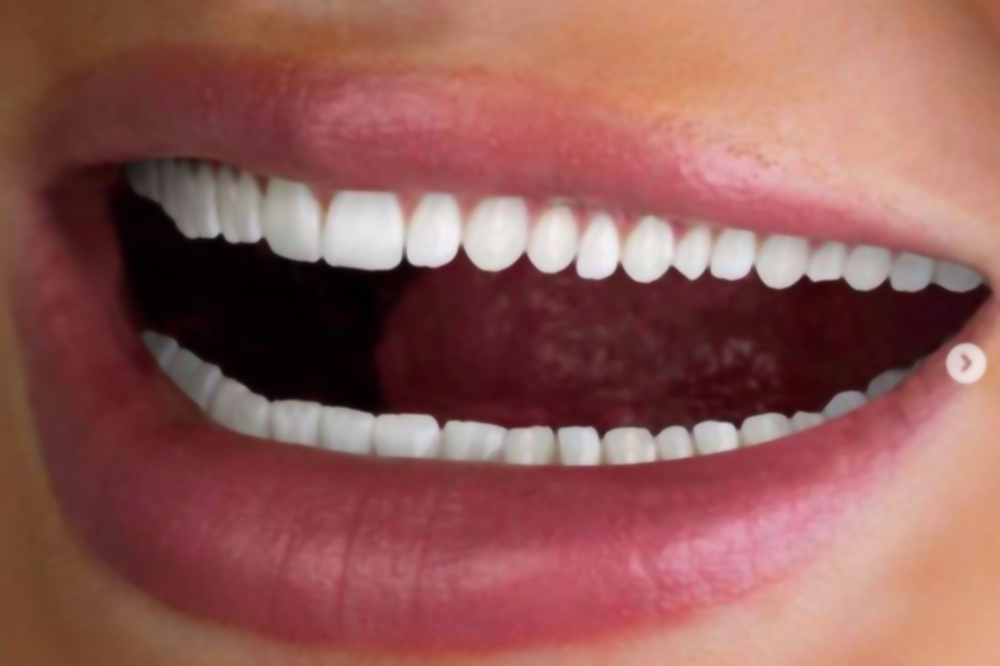

In [ ]:
blur = cv2.blur(img,(5,5))
print('blur')
cv2_imshow(blur)
blur0=cv2.medianBlur(blur,5)
print('blur0')
cv2_imshow(blur0)
blur1= cv2.GaussianBlur(blur0,(5,5),0)
print('blur1')
cv2_imshow(blur1)
blur2= cv2.bilateralFilter(blur1,9,75,75)
print('blur2')
cv2_imshow(blur2)

def blur(img):
  blur = cv2.blur(img,(5,5))
  blur0=cv2.medianBlur(blur,5)
  blur1= cv2.GaussianBlur(blur0,(5,5),0)
  blur2= cv2.bilateralFilter(blur1,9,75,75)
  return blur2

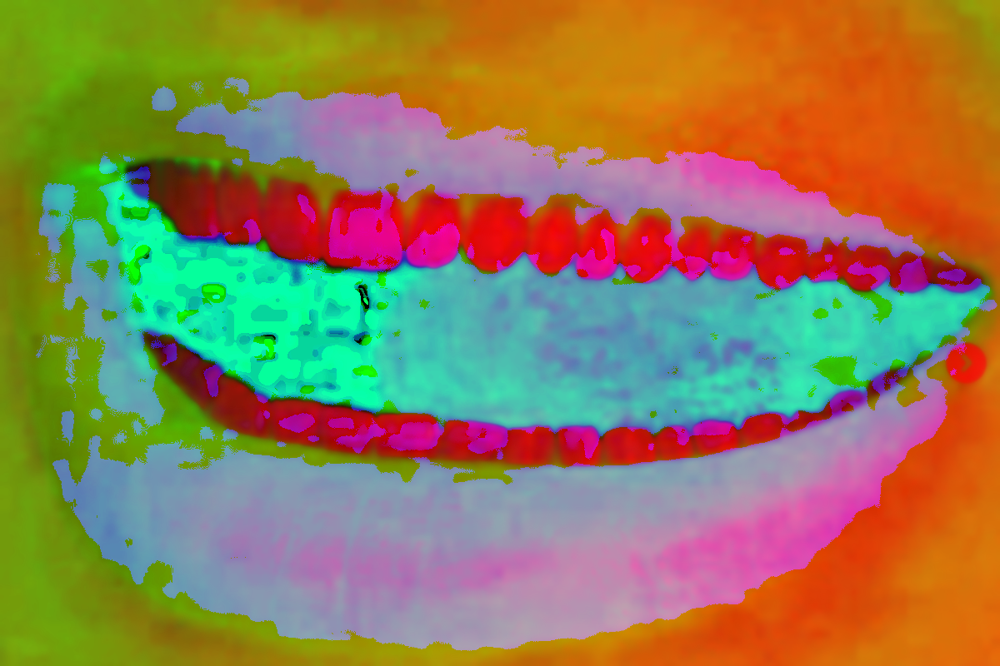

In [ ]:
hsv = cv2.cvtColor(blur2, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)
def toHSV(imgtemp):
  hsv = cv2.cvtColor(imgtemp, cv2.COLOR_BGR2HSV)
  return hsv 

mask


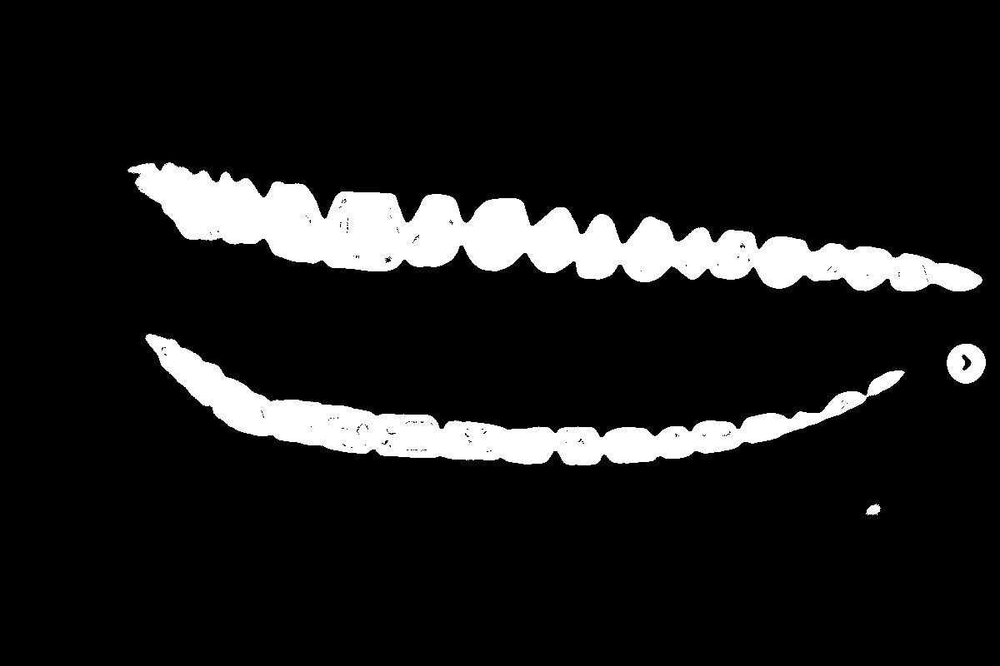

overlay


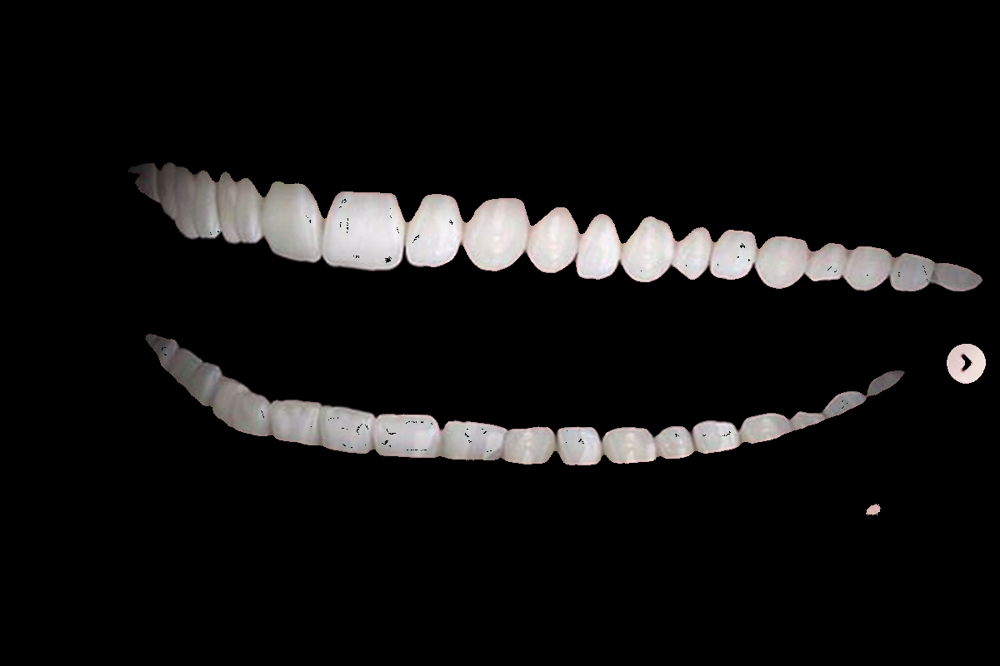

In [ ]:
#color cutoffs
low_color = np.array([0, 1, 0])
high_color = np.array([180, 50, 255])
mask = cv2.inRange(hsv, low_color, high_color)
res = cv2.bitwise_and(img,img, mask= mask)
print('mask')
cv2_imshow(mask)
print('overlay')
cv2_imshow(res)
def toothmask(hsv, low_color, high_color):
  # low_blue = np.array([0, 1, 0])
  # high_blue = np.array([180, 50, 255])
  mask = cv2.inRange(hsv, low_color, high_color)
  res = cv2.bitwise_and(img,img, mask= mask)
  mask = mask.astype(np.uint8)
  return mask


In [ ]:
#Augmentation Functions:

#Brightness
def brightness(img, low, high):
    value = random.uniform(low, high)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hsv = np.array(hsv, dtype = np.float64)
    hsv[:,:,1] = hsv[:,:,1]*value
    hsv[:,:,1][hsv[:,:,1]>255]  = 255
    hsv[:,:,2] = hsv[:,:,2]*value 
    hsv[:,:,2][hsv[:,:,2]>255]  = 255
    hsv = np.array(hsv, dtype = np.uint8)
    img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return img
#img = brightness(img, 0.5, 3)

#Channel shift
def channel_shift(img, value):
    value = int(random.uniform(-value, value))
    img = img + value
    img[:,:,:][img[:,:,:]>255]  = 255
    img[:,:,:][img[:,:,:]<0]  = 0
    img = img.astype(np.uint8)
    return img
#img = channel_shift(img, 60)

#Horizontal Flip
def horizontal_flip(img, flag):
    if flag:
        return cv2.flip(img, 1)
    else:
        return img
#img = horizontal_flip(img, True)

#Vertical Flip
def vertical_flip(img, flag):
    if flag:
        return cv2.flip(img, 0)
    else:
        return img
#img = vertical_flip(img, True)

In [ ]:
#Number of files to be obtained from the folder
limit = 500

In [ ]:
#Empty list for image paths
imgPaths = [] 
#Getting list of datafiles of a specified length
for f in os.listdir(dataPath)[:limit]:
  if f.endswith(('.jpg', '.png', '.jpeg')):
    tempFPath = dataPath+"/"+f
    imgPaths.append(tempFPath)
    

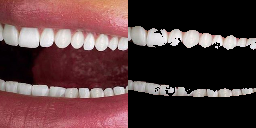

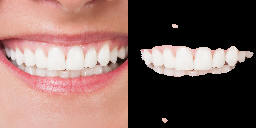

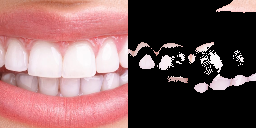

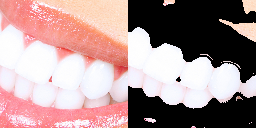

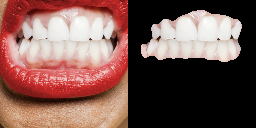

...

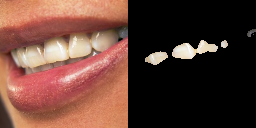

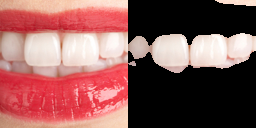

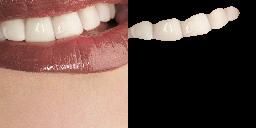

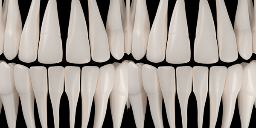

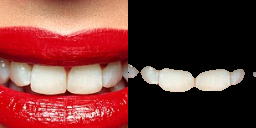

In [ ]:
segmentedmasks = []
imagelist = []
low_color = np.array([0, 0, 70])
high_color = np.array([170, 55, 255])
imageWidth = 128
scale = 0.5
imgblank = np.zeros([imageWidth,imageWidth,3],dtype=np.uint8)
imgblank.fill(255)
def to_tensor(img):
  return tf.convert_to_tensor(img, dtype=tf.float32)
#Iterating through images in folder
for imgPath in imgPaths:
  img = cv2.imread(imgPath)
  center_x, center_y = img.shape[1] / 2, img.shape[0] / 2
  width_scaled = img.shape[1] * scale
  if width_scaled > img.shape[0]:
    width_scaled = img.shape[0]
  left_x, right_x = center_x - width_scaled / 2, center_x + width_scaled / 2
  top_y, bottom_y = center_y - width_scaled / 2, center_y + width_scaled / 2
  img = img[int(top_y):int(bottom_y), int(left_x):int(right_x)]
  width = imageWidth
  height = int((img.shape[0] /img.shape[1])*imageWidth)
  dim = (width, height)
  # resize image
  img = cv2.resize(img, dim, interpolation = cv2.INTER_LINEAR)
  if img.shape[0] == imageWidth:
    mask = toothmask(toHSV(blur(img)), low_color, high_color)
    maskimg = cv2.bitwise_and(imgblank,imgblank, mask= mask)
    res = cv2.bitwise_and(img,img, mask= mask)
    cv2_imshow(cv2.hconcat([img, res]))
    #Augment Dataset
    bright_img = to_tensor(brightness(img, 0.5, 3))
    #bright_mask = mask
    channelshift_img = to_tensor(channel_shift(img, 60))
    # channelshift_mask = mask
    hflip_img = to_tensor(horizontal_flip(img, True))
    #hflip mask
    vflip_img = to_tensor(vertical_flip(img, True))
    #vflip mask
    
    #Convert to tensor here
    img = to_tensor(img)
    mask = np.expand_dims(mask, axis=2)
    mask = np.where(mask == 0, 1, mask)
    mask = np.where(mask == 255, 3, mask)
    hflip_mask = horizontal_flip(mask, True)
    hflip_mask = to_tensor(np.expand_dims(hflip_mask, axis=2))
    vflip_mask = vertical_flip(mask, True)
    vflip_mask = to_tensor(np.expand_dims(vflip_mask, axis=2))
    mask = to_tensor(mask)
    segmentedmasks.append(mask)
    imagelist.append(img)
    segmentedmasks.append(mask)
    imagelist.append(bright_img)
    segmentedmasks.append(mask)
    imagelist.append(channelshift_img)
    segmentedmasks.append(hflip_mask)
    imagelist.append(hflip_img)
    segmentedmasks.append(vflip_mask)
    imagelist.append(vflip_img)

In [ ]:
def normalize(input_image, input_mask):
  input_image = tf.cast(input_image, tf.float32) / 255.0
  input_mask -= 1
  return input_image, input_mask
  tf.unique(tf.reshape(segmentedmasks[0], [-1]))

In [ ]:
def load_image(datapoint):
  input_image = tf.image.resize(datapoint['image'], (128, 128))
  input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

  input_image, input_mask = normalize(input_image, input_mask)

  return input_image, input_mask

In [ ]:
# x = [segmentedImages[0]['image']]
# y = [segmentedImages[0]['segmentation_mask']]

xy = tf.data.Dataset.from_tensor_slices({'image':imagelist, 'segmentation_mask':segmentedmasks})
#debugging tensor slices shape
# print(xy)
dataset = xy.prefetch(1)
#debuggin the dataset shape
# print(dataset)
#debugging image mask values
# print(tf.unique(tf.reshape(segmentedmasks[0], [-1])))

In [ ]:
len(dataset)

575

In [ ]:
test_len = int(len(dataset) * 0.2) # 20 percent of length of ds

train_images_data = dataset.skip(test_len)
test_images_data = dataset.take(test_len)  
train_images = train_images_data.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_images = test_images_data.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_len = int(len(dataset) * 0.2) # 20 percent of length of ds

print(train_images)
print(test_images)

<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>
<ParallelMapDataset shapes: ((128, 128, 3), (128, 128, 1)), types: (tf.float32, tf.float32)>


In [ ]:
TRAIN_LENGTH = len(train_images)
BATCH_SIZE = 150 #about a third of the training data
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = 2

In [ ]:
class Augment(tf.keras.layers.Layer):
  def __init__(self, seed=42):
    super().__init__()
    # both use the same seed, so they'll make the same random changes.
    self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
    self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

  def call(self, inputs, labels):
    inputs = self.augment_inputs(inputs)
    labels = self.augment_labels(labels)
    return inputs, labels

In [ ]:
train_batches = (
    train_images
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_images.batch(BATCH_SIZE)

In [ ]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

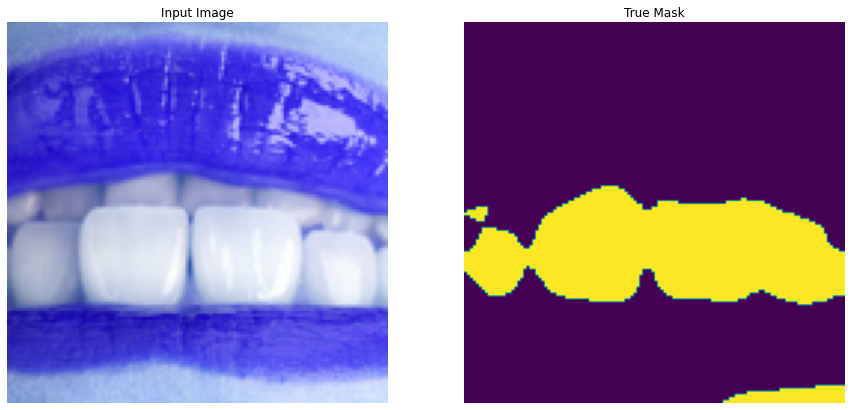

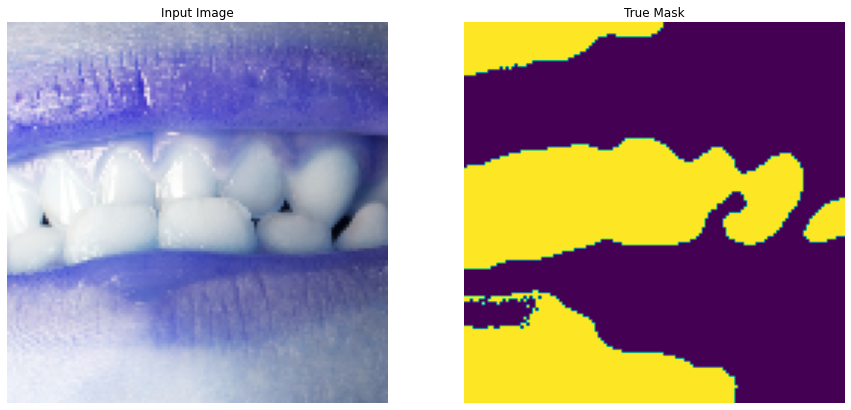

Unique(y=<tf.Tensor: shape=(2,), dtype=float32, numpy=array([2., 0.], dtype=float32)>, idx=<tf.Tensor: shape=(16384,), dtype=int32, numpy=array([0, 0, 0, ..., 1, 1, 1], dtype=int32)>)

In [ ]:
for images, masks in train_batches.take(2):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])
tf.unique(tf.reshape(sample_mask, [-1]))

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


In [ ]:
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [ ]:
def unet_model(output_channels:int):
  inputs = tf.keras.layers.Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      filters=output_channels, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [ ]:
OUTPUT_CLASSES = 3

model = unet_model(output_channels=OUTPUT_CLASSES)
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

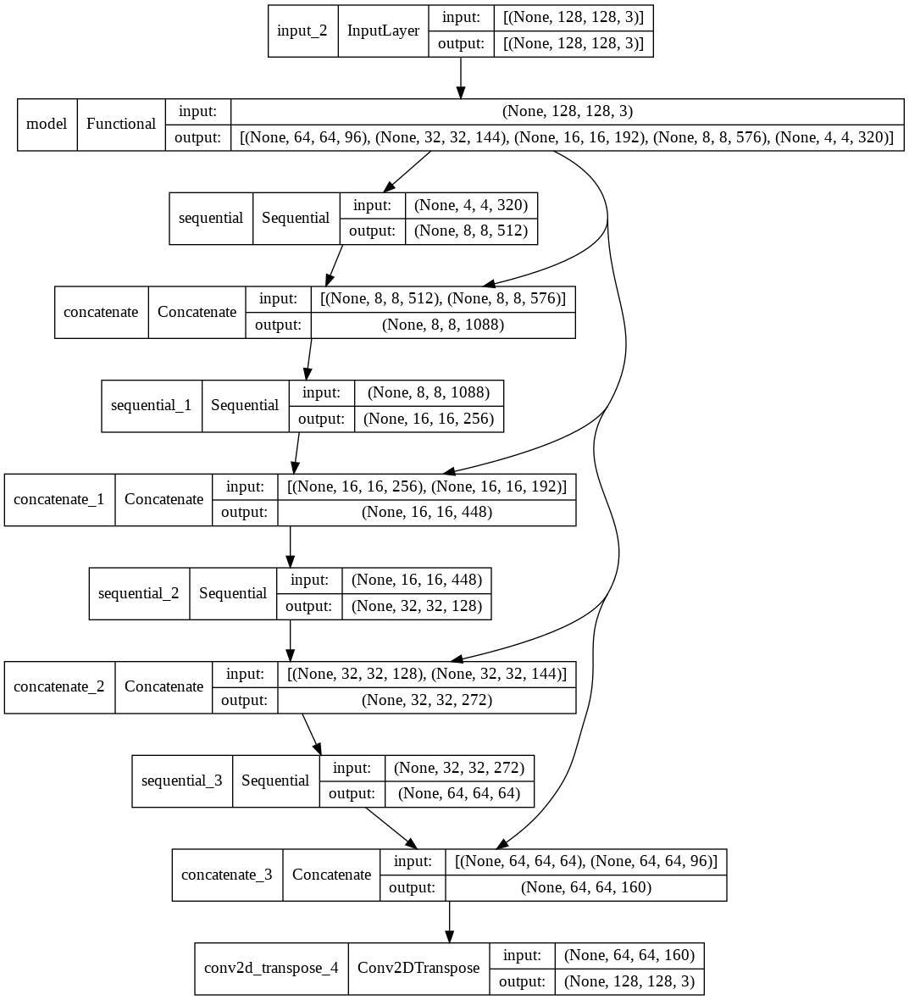

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [ ]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

In [ ]:
for image, mask in dataset.take(1):
  print(image)
# dataset.take(1)

image


In [ ]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

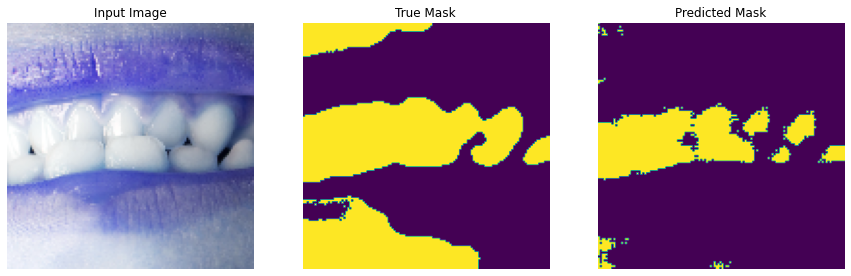


Sample Prediction after epoch 20

2/2 [==============================] - 1s 642ms/step - loss: 0.2138 - accuracy: 0.9171 - val_loss: 0.2614 - val_accuracy: 0.8968


In [ ]:
EPOCHS = 20
VAL_SUBSPLITS = 2
VALIDATION_STEPS = len(train_images)//BATCH_SIZE//VAL_SUBSPLITS


model_history = model.fit(train_batches, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=test_batches,
                          callbacks=[DisplayCallback()])

In [ ]:
print(VALIDATION_STEPS)
len(segmentedmasks)

1


575

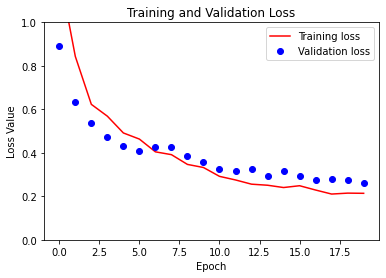

In [ ]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

plt.figure()
plt.plot(model_history.epoch, loss, 'r', label='Training loss')
plt.plot(model_history.epoch, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

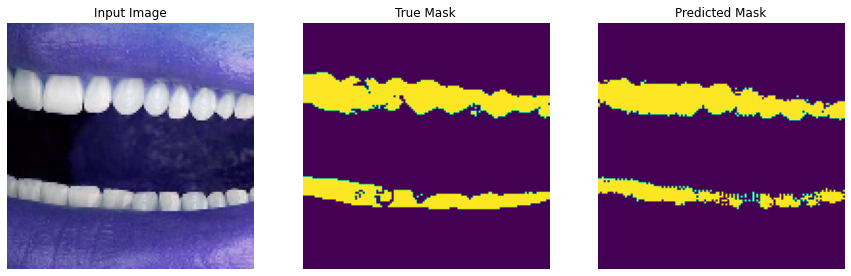

In [ ]:
show_predictions(test_batches, 3)

In [ ]:
try:
  model_history = model.fit(train_batches, epochs=EPOCHS,
                            steps_per_epoch=STEPS_PER_EPOCH,
                            class_weight = {0:2.0, 1:2.0, 2:1.0})
  assert False
except Exception as e:
  print(f"Expected {type(e).__name__}: {e}")

Expected ValueError: `class_weight` not supported for 3+ dimensional targets.


In [ ]:
label = [0,0]
prediction = [[-3., 0], [-3, 0]] 
sample_weight = [1, 10] 

loss = tf.losses.SparseCategoricalCrossentropy(from_logits=True,
                                               reduction=tf.losses.Reduction.NONE)
loss(label, prediction, sample_weight).numpy()

array([ 3.0485873, 30.485874 ], dtype=float32)

In [ ]:
def add_sample_weights(image, label):
  # The weights for each class, with the constraint that:
  #     sum(class_weights) == 1.0
  class_weights = tf.constant([2.0, 2.0, 1.0])
  class_weights = class_weights/tf.reduce_sum(class_weights)

  # Create an image of `sample_weights` by using the label at each pixel as an 
  # index into the `class weights` .
  sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))

  return image, label, sample_weights

In [ ]:
train_batches.map(add_sample_weights).element_spec

(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))

In [ ]:
weighted_model = unet_model(OUTPUT_CLASSES)
weighted_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

In [ ]:
weighted_model.fit(
    train_batches.map(add_sample_weights),
    epochs=20,
    steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/20
2/2 [==============================] - 4s 160ms/step - loss: 0.3744 - accuracy: 0.4858
Epoch 2/20
2/2 [==============================] - 0s 26ms/step - loss: 0.2415 - accuracy: 0.6516
Epoch 3/20
2/2 [==============================] - 0s 159ms/step - loss: 0.1530 - accuracy: 0.7563
Epoch 4/20
2/2 [==============================] - 0s 26ms/step - loss: 0.1253 - accuracy: 0.7857
Epoch 5/20
2/2 [==============================] - 0s 157ms/step - loss: 0.1074 - accuracy: 0.7884
Epoch 6/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0980 - accuracy: 0.8015
Epoch 7/20
2/2 [==============================] - 0s 156ms/step - loss: 0.0917 - accuracy: 0.8097
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0796 - accuracy: 0.8527
Epoch 9/20
2/2 [==============================] - 0s 160ms/step - loss: 0.0770 - accuracy: 0.8551
Epoch 10/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0714 - accuracy: 0.8726
Epoch 11/20
2/2 [=======

In [ ]:
def show_predictions_weighted(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = weighted_model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(weighted_model.predict(sample_image[tf.newaxis, ...]))])

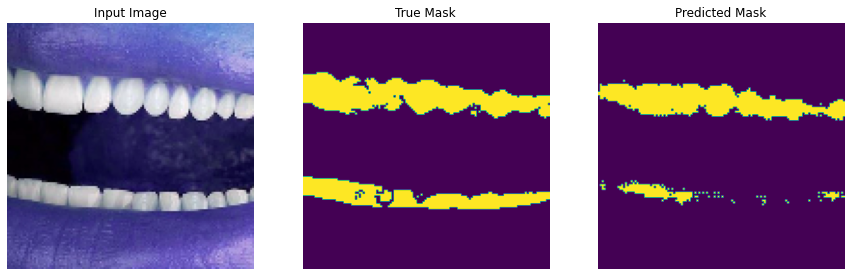

<BatchDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 1)), types: (tf.float32, tf.float32)>

In [ ]:
show_predictions_weighted(test_batches, 3)
test_batches

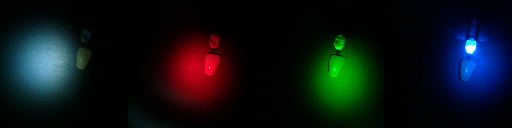

(128, 128, 3)


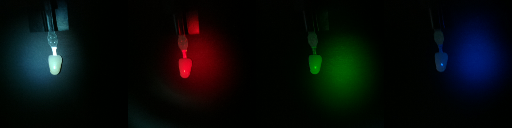

(128, 128, 3)


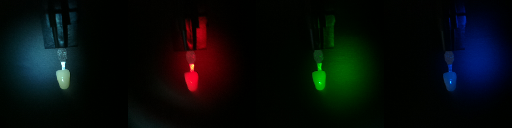

(128, 128, 3)


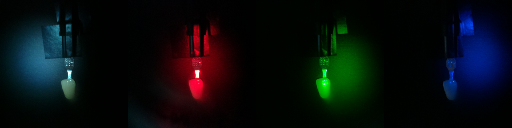

(128, 128, 3)


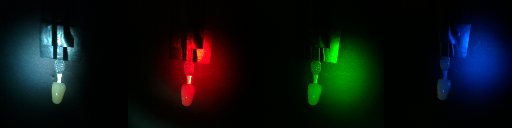

(128, 128, 3)


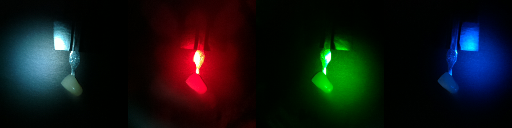

(128, 128, 3)


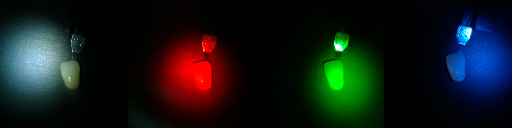

(128, 128, 3)


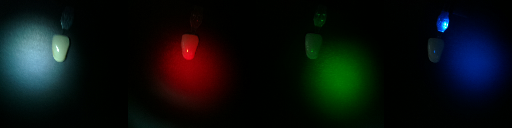

(128, 128, 3)


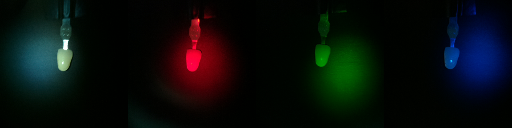

(128, 128, 3)


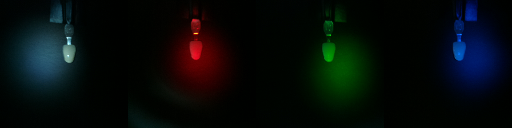

(128, 128, 3)


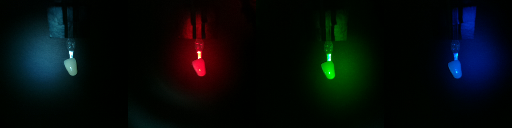

(128, 128, 3)


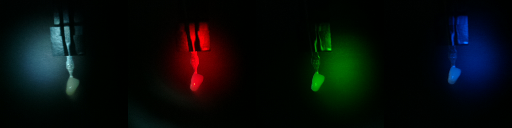

(128, 128, 3)


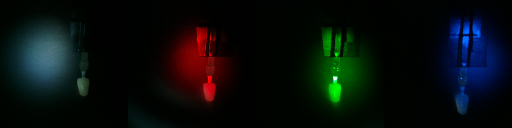

(128, 128, 3)


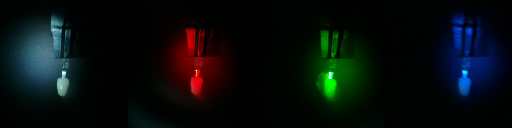

(128, 128, 3)


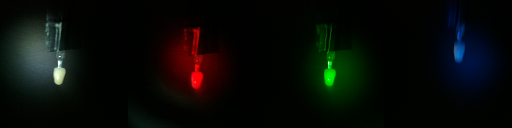

(128, 128, 3)


In [ ]:
shadesamples = ['A4','C4','B4','A3.5','B3','D3','A3','D4','C2','C1','A2','D2','B2','B1','A1']
#shape of dataset: (sample color, white light, red light, green light, blue light)
#importing new data
dataPath = "/content/gdrive/MyDrive/Science/IndependentStudy12th/ToothImageData/PiPictures"
#Empty list for device images
deviceImg = []  
#image dimensions
dim = (128,128)
#convert to tensor
def to_tensor(img):
  return tf.convert_to_tensor(img, dtype=tf.float32)
#Getting list of images
for f in os.listdir(dataPath)[:]:
  if f in shadesamples:
    tempFPath = dataPath+"/"+f
    wtemppath = tempFPath+"/"+"g.jpg"
    rtemppath = tempFPath+"/"+"b.jpg"
    gtemppath = tempFPath+"/"+"r.jpg"
    btemppath = tempFPath+"/"+"w.jpg"
    wimg = cv2.imread(wtemppath)
    rimg = cv2.imread(rtemppath)
    gimg = cv2.imread(gtemppath)
    bimg = cv2.imread(btemppath)
    wimg = cv2.resize(wimg, dim, interpolation = cv2.INTER_LINEAR)
    rimg = cv2.resize(rimg, dim, interpolation = cv2.INTER_LINEAR)
    gimg = cv2.resize(gimg, dim, interpolation = cv2.INTER_LINEAR)
    bimg = cv2.resize(bimg, dim, interpolation = cv2.INTER_LINEAR)
    cv2_imshow(cv2.hconcat([wimg, rimg, gimg, bimg]))
    wimg = to_tensor(wimg)
    rimg = to_tensor(rimg)
    gimg = to_tensor(gimg)
    bimg = to_tensor(bimg)
    deviceImg.append((f,wimg,rimg,gimg,bimg))
    print(deviceImg[0][1].shape)

In [ ]:
def to_cvmask(pred_mask):
  pred_mask = pred_mask.numpy()
  pred_mask = np.where(mask == 1, 0, pred_mask)
  pred_mask = np.where(mask == 3, 255, pred_mask)

In [ ]:
def normalize(white_image, red_image, green_image, blue_image):
  white_image = tf.cast(white_image, tf.float32) / 255.0
  red_image = tf.cast(red_image, tf.float32) / 255.0
  green_image = tf.cast(green_image, tf.float32) / 255.0
  blue_image = tf.cast(blue_image, tf.float32) / 255.0
  return white_image, red_image, green_image, blue_image

In [ ]:
def load_image(datapoint):
  white_image = tf.image.resize(datapoint['wimage'], (128, 128))
  # red_image = tf.image.resize(datapoint['rimage'], (128, 128))
  # green_image = tf.image.resize(datapoint['gimage'], (128, 128))
  # blue_image = tf.image.resize(datapoint['bimage'], (128, 128))

  white_image, red_image, green_image, blue_image = normalize(white_image, red_image, green_image, blue_image)

  return white_image, red_image, green_image, blue_image

In [ ]:
yx = tf.data.Dataset.from_tensor_slices({'wimage':deviceImg[0][1],'rimage':deviceImg[0][2],'gimage':deviceImg[0][3],'bimage':deviceImg[0][4]})
yx
# dataset = yx.prefetch(1)
# white_images = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

<TensorSliceDataset shapes: {wimage: (128, 3), rimage: (128, 3), gimage: (128, 3), bimage: (128, 3)}, types: {wimage: tf.float32, rimage: tf.float32, gimage: tf.float32, bimage: tf.float32}>

In [ ]:
weighted_model.predict(dataset['image'])